<a href="https://colab.research.google.com/github/RobertFlan02/Dietetics-FYP/blob/main/Dietetics-FYP/Experiments/Pipeline/Experiment%201/Pipeline1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install -q segmentation-models-pytorch albumentations

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 95.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 82.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 37.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
!pip install ultralytics --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 26.7 MB/s eta 0:00:00


In [4]:


# 2. Imports
import os, io, cv2, numpy as np, pandas as pd, torch
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
import yaml
from ultralytics import YOLO  # ensure: !pip install ultralytics --upgrade
import segmentation_models_pytorch as smp

# 3. Build YOLO-to-U-Net Mapping and ID-to-Food Name Mapping
csv_path = "/content/drive/MyDrive/foodseg103/class_mappings.csv"
df_mapping = pd.read_csv(csv_path)
yolo_to_unet = {}
id_to_food = {0: "background"}

for _, row in df_mapping.iterrows():
    if int(row["Class Id"]) > 0:
        yolo_id = int(row["Class Id"]) - 1  # YOLO: candy=0, egg tart=1, ...
        unet_id = int(row["Class Id"])     # U-Net: background=0, candy=1, egg tart=2, ...
        yolo_to_unet[yolo_id] = unet_id
        id_to_food[unet_id] = row["Class Name"]

print("YOLO to U-Net mapping:", yolo_to_unet)
print("ID to Food mapping:", id_to_food)

# 4. Load Validation Data from Parquet (with ground truth mask)
val_parquet_path = "/content/drive/MyDrive/foodseg103/validation-00000-of-00001-a5bfdaa5beb7006a.parquet"
val_df = pd.read_parquet(val_parquet_path)
print(f"Loaded {len(val_df)} validation samples.")

def extract_image_and_gt(row):
    """Extract a PIL image and its ground truth segmentation mask from a parquet row."""
    img_bytes = row['image'].get("bytes")
    if img_bytes is None:
        raise ValueError("No image bytes found.")
    img = Image.open(io.BytesIO(img_bytes)).convert("RGB")

    mask_bytes = row['label'].get("bytes")
    if mask_bytes is None:
        raise ValueError("No mask bytes found.")
    gt_mask = Image.open(io.BytesIO(mask_bytes))
    return img, gt_mask

# 5. Load YOLO Detection Model
yolo_model_path = "/content/drive/MyDrive/food_yolo/results/yolov8l_detect_balanced/weights/best.pt"
yolo_model = YOLO(yolo_model_path)
print("YOLO model loaded.")

# 6. Set Device and Load U-Net Segmentation Model (using your actual architecture)
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
unet_model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights="imagenet",
    in_channels=3,
    classes=104,
)
unet_model = unet_model.to(DEVICE)
checkpoint = torch.load("/content/drive/MyDrive/foodseg103/unet_checkpoint_model2.pth", map_location=DEVICE)
unet_model.load_state_dict(checkpoint["model_state_dict"])
unet_model.eval()
print("U-Net model loaded on", DEVICE)

# 7. Define Metric Functions
def compute_pixel_accuracy(pred, gt):
    return np.sum(pred == gt) / pred.size

def compute_iou(pred, gt, num_classes=104):
    ious = []
    for cls in range(num_classes):
        pred_cls = (pred == cls).astype(np.uint8)
        gt_cls = (gt == cls).astype(np.uint8)
        intersection = np.sum((pred_cls & gt_cls))
        union = np.sum((pred_cls | gt_cls))
        if union == 0:
            continue
        ious.append(intersection / union)
    return np.mean(ious) if ious else 0.0

def compute_dice(pred, gt, num_classes=104):
    dices = []
    for cls in range(num_classes):
        pred_cls = (pred == cls).astype(np.uint8)
        gt_cls = (gt == cls).astype(np.uint8)
        intersection = np.sum(pred_cls * gt_cls)
        total = np.sum(pred_cls) + np.sum(gt_cls)
        if total == 0:
            continue
        dices.append((2 * intersection) / total)
    return np.mean(dices) if dices else 0.0

def list_food_items(seg_mask):
    unique = np.unique(seg_mask)
    items = [id_to_food.get(cls, f"Class {cls}") for cls in unique if cls != 0]
    return items

# 8. Function to Run Raw U-Net on Full Image (for comparison)
def raw_unet_segmentation(img, target_size=(256,256)):
    orig_size = img.size  # (width, height)
    img_resized = img.resize(target_size)
    img_tensor = torch.from_numpy(np.array(img_resized)).permute(2,0,1).float()/255.0
    img_tensor = img_tensor.unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        logits = unet_model(img_tensor)
        pred = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()
    seg_mask = Image.fromarray(pred.astype(np.uint8)).resize((orig_size[0], orig_size[1]), resample=Image.NEAREST)
    return np.array(seg_mask)

# 9. Confidence-Injection Pipeline
def process_image_pipeline_conf_injection(img, ALPHA=3.0):
    """
    For each YOLO detection:
      - Crop region (with minimal padding=2)
      - Run U-Net on the crop (256x256)
      - "Inject" YOLO confidence into the logit channel for the YOLO class:
           fused_logits[:, YOLO_class, ...] += conf * ALPHA
      - Argmax to get predicted class for each pixel
      - Keep only pixels that match YOLO_class in the final mask
      - Merge into a full-image segmentation
    """
    final_seg = np.zeros((img.height, img.width), dtype=np.uint8)

    results = yolo_model(img)
    if len(results) == 0 or results[0].boxes is None:
        print("No detections found.")
        return final_seg
    detections = results[0].boxes

    for box in detections:
        coords = box.xyxy[0].cpu().numpy()  # [x1, y1, x2, y2]
        conf = float(box.conf.cpu().numpy()[0])
        x1, y1, x2, y2 = map(int, coords)

        # Minimal padding = 2
        pad = 2
        x1 = max(0, x1 - pad)
        y1 = max(0, y1 - pad)
        x2 = min(img.width, x2 + pad)
        y2 = min(img.height, y2 + pad)

        crop = img.crop((x1, y1, x2, y2))
        crop_resized = crop.resize((256,256))
        crop_tensor = torch.from_numpy(np.array(crop_resized)).permute(2,0,1).float()/255.0
        crop_tensor = crop_tensor.unsqueeze(0).to(DEVICE)

        with torch.no_grad():
            logits = unet_model(crop_tensor)  # [1, 104, 256, 256]

        yolo_cls = int(box.cls.cpu().numpy()[0])
        unet_target_class = yolo_to_unet.get(yolo_cls, None)
        if unet_target_class is None:
            continue

        # Confidence injection
        # We add (conf * ALPHA) to the logit channel for the YOLO-detected class
        fused_logits = logits.clone()
        fused_logits[:, unet_target_class, :, :] += conf * ALPHA

        # Argmax
        fused_pred = torch.argmax(fused_logits, dim=1).squeeze(0).cpu().numpy()

        # Resize fused prediction back to crop
        fused_crop = Image.fromarray(fused_pred.astype(np.uint8)).resize((x2 - x1, y2 - y1), resample=Image.NEAREST)
        fused_crop_np = np.array(fused_crop)

        # Keep only pixels == unet_target_class
        binary_mask = (fused_crop_np == unet_target_class).astype(np.uint8)

        # Merge into final_seg
        region = final_seg[y1:y2, x1:x2]
        region[binary_mask == 1] = unet_target_class
        final_seg[y1:y2, x1:x2] = region

    return final_seg

# 10. Draw YOLO Bounding Boxes for Visualization
def draw_yolo_boxes(img):
    img_box = np.array(img).copy()
    results = yolo_model(img)
    if len(results) == 0 or results[0].boxes is None:
        return img_box
    detections = results[0].boxes
    for box in detections:
        coords = box.xyxy[0].cpu().numpy()
        x1, y1, x2, y2 = map(int, coords)
        pad = 2  # match our minimal padding
        x1 = max(0, x1 - pad)
        y1 = max(0, y1 - pad)
        x2 = min(img.width, x2 + pad)
        y2 = min(img.height, y2 + pad)
        cv2.rectangle(img_box, (x1,y1), (x2,y2), (0,255,0), 2)
    return img_box

# 11. Evaluate Performance
def evaluate_segmentation(pred, gt, num_classes=104):
    pix_acc = compute_pixel_accuracy(pred, gt)
    miou = compute_iou(pred, gt, num_classes)
    dice = compute_dice(pred, gt, num_classes)
    return pix_acc, miou, dice

# 12. Main Loop: Show 3 Validation Samples
for idx in range(3):
    try:
        row = val_df.iloc[idx]
        img, gt_mask_img = extract_image_and_gt(row)
        gt_mask = np.array(gt_mask_img.convert("L"))  # ground truth label

        # Raw U-Net (no YOLO guidance)
        raw_seg = raw_unet_segmentation(img)

        # YOLO bounding boxes for visualization
        yolo_box_img = draw_yolo_boxes(img)

        # Combined approach: confidence injection
        fused_seg = process_image_pipeline_improved(img, ALPHA=3.0)

        # Compute metrics
        pix_acc, miou, dice = evaluate_segmentation(fused_seg, gt_mask)

        # List predicted vs. true classes
        pred_items = list_food_items(fused_seg)
        true_items = list_food_items(gt_mask)

        # Display results
        fig, axes = plt.subplots(2, 2, figsize=(15,15))
        axes[0,0].imshow(img)
        axes[0,0].set_title("Original Image")
        axes[0,0].axis("off")

        axes[0,1].imshow(yolo_box_img)
        axes[0,1].set_title("YOLO Bounding Boxes")
        axes[0,1].axis("off")

        axes[1,0].imshow(raw_seg, cmap="jet")
        axes[1,0].set_title("Raw U-Net Segmentation")
        axes[1,0].axis("off")

        axes[1,1].imshow(fused_seg, cmap="jet")
        axes[1,1].set_title("Fused (Confidence Injection)")
        axes[1,1].axis("off")

        plt.suptitle(
            f"Image {idx} Metrics:\n"
            f"Pixel Acc: {pix_acc:.4f}, mIoU: {miou:.4f}, Dice: {dice:.4f}\n"
            f"Predicted: {pred_items} | True: {true_items}",
            fontsize=16
        )
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error processing image {idx}: {e}")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


KeyboardInterrupt: 

YOLO to U-Net mapping: {0: 1, 1: 2, 2: 3, 3: 4, 4: 5, 5: 6, 6: 7, 7: 8, 8: 9, 9: 10, 10: 11, 11: 12, 12: 13, 13: 14, 14: 15, 15: 16, 16: 17, 17: 18, 18: 19, 19: 20, 20: 21, 21: 22, 22: 23, 23: 24, 24: 25, 25: 26, 26: 27, 27: 28, 28: 29, 29: 30, 30: 31, 31: 32, 32: 33, 33: 34, 34: 35, 35: 36, 36: 37, 37: 38, 38: 39, 39: 40, 40: 41, 41: 42, 42: 43, 43: 44, 44: 45, 45: 46, 46: 47, 47: 48, 48: 49, 49: 50, 50: 51, 51: 52, 52: 53, 53: 54, 54: 55, 55: 56, 56: 57, 57: 58, 58: 59, 59: 60, 60: 61, 61: 62, 62: 63, 63: 64, 64: 65, 65: 66, 66: 67, 67: 68, 68: 69, 69: 70, 70: 71, 71: 72, 72: 73, 73: 74, 74: 75, 75: 76, 76: 77, 77: 78, 78: 79, 79: 80, 80: 81, 81: 82, 82: 83, 83: 84, 84: 85, 85: 86, 86: 87, 87: 88, 88: 89, 89: 90, 90: 91, 91: 92, 92: 93, 93: 94, 94: 95, 95: 96, 96: 97, 97: 98, 98: 99, 99: 100, 100: 101, 101: 102, 102: 103}
ID to Food mapping: {0: 'background', 1: 'candy', 2: 'egg tart', 3: 'french fries', 4: 'chocolate', 5: 'biscuit', 6: 'popcorn', 7: 'pudding', 8: 'ice cream', 9: 'ch

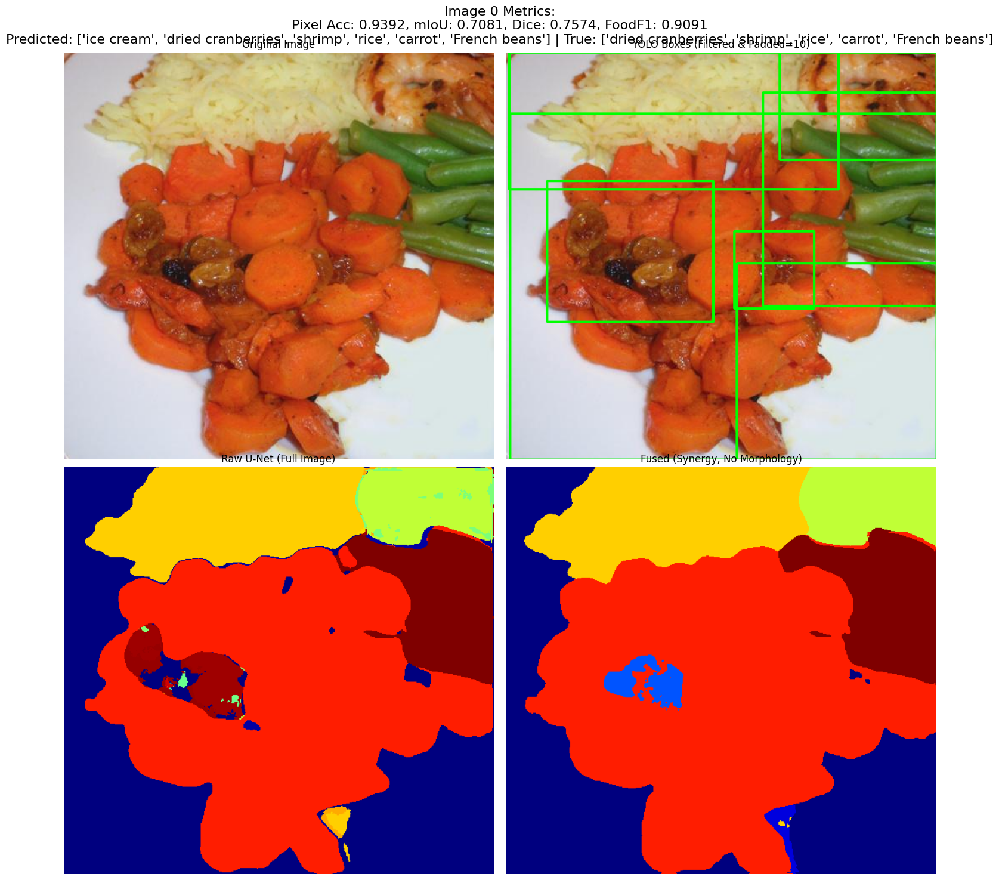


0: 608x640 1 shrimp, 1 carrot, 1 green beans, 813.5ms
Speed: 3.1ms preprocess, 813.5ms inference, 1.4ms postprocess per image at shape (1, 3, 608, 640)

0: 608x640 1 shrimp, 1 carrot, 1 green beans, 804.3ms
Speed: 6.4ms preprocess, 804.3ms inference, 1.4ms postprocess per image at shape (1, 3, 608, 640)


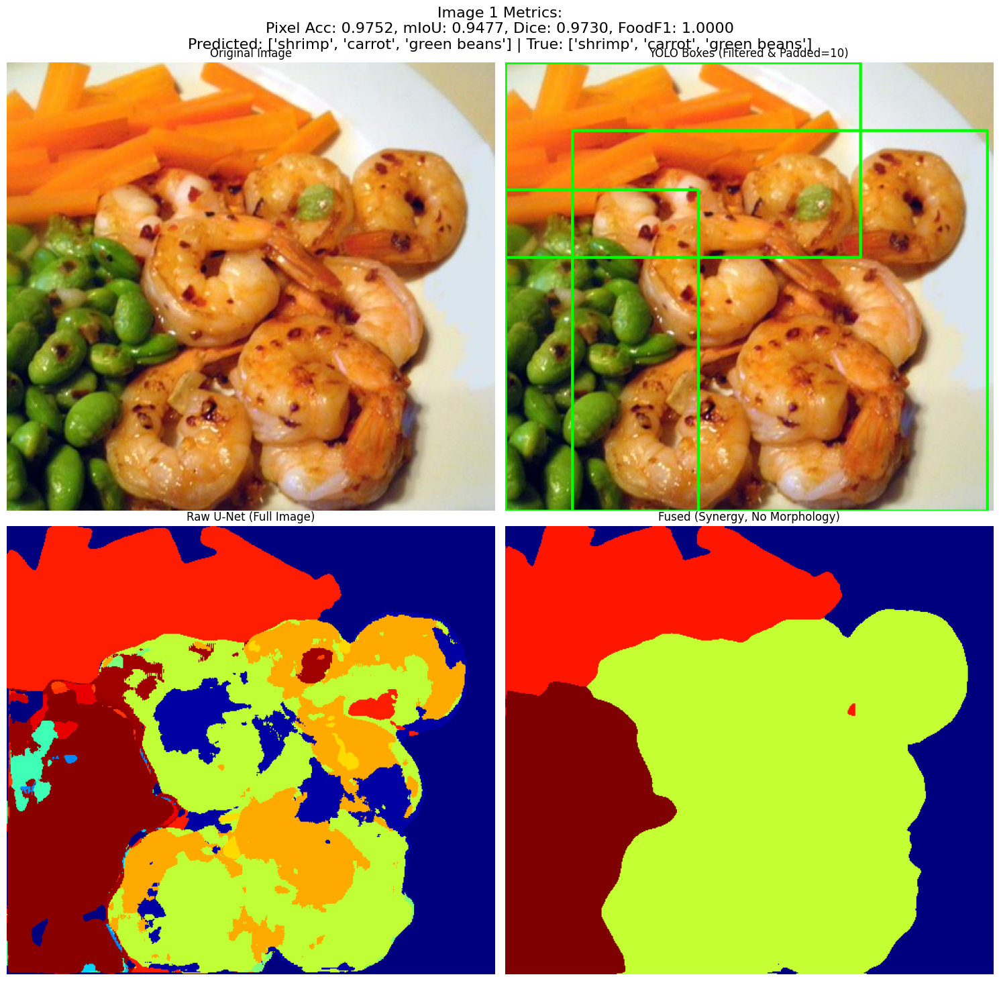


0: 480x640 1 ice cream, 1 olives, 1 bread, 1 potato, 1 tomato, 1 other ingredients, 723.2ms
Speed: 25.3ms preprocess, 723.2ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 ice cream, 1 olives, 1 bread, 1 potato, 1 tomato, 1 other ingredients, 685.5ms
Speed: 33.3ms preprocess, 685.5ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


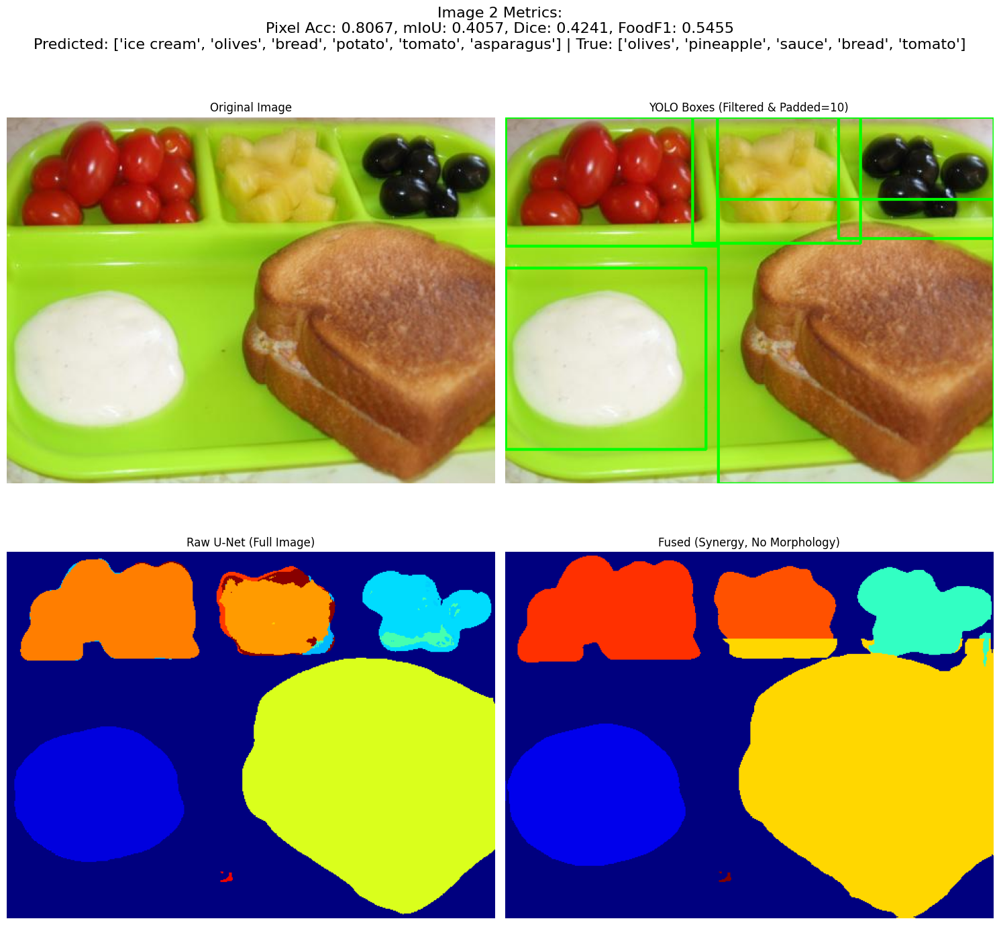


0: 480x640 1 chocolate, 1 cake, 647.0ms
Speed: 3.2ms preprocess, 647.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chocolate, 1 cake, 655.8ms
Speed: 3.1ms preprocess, 655.8ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


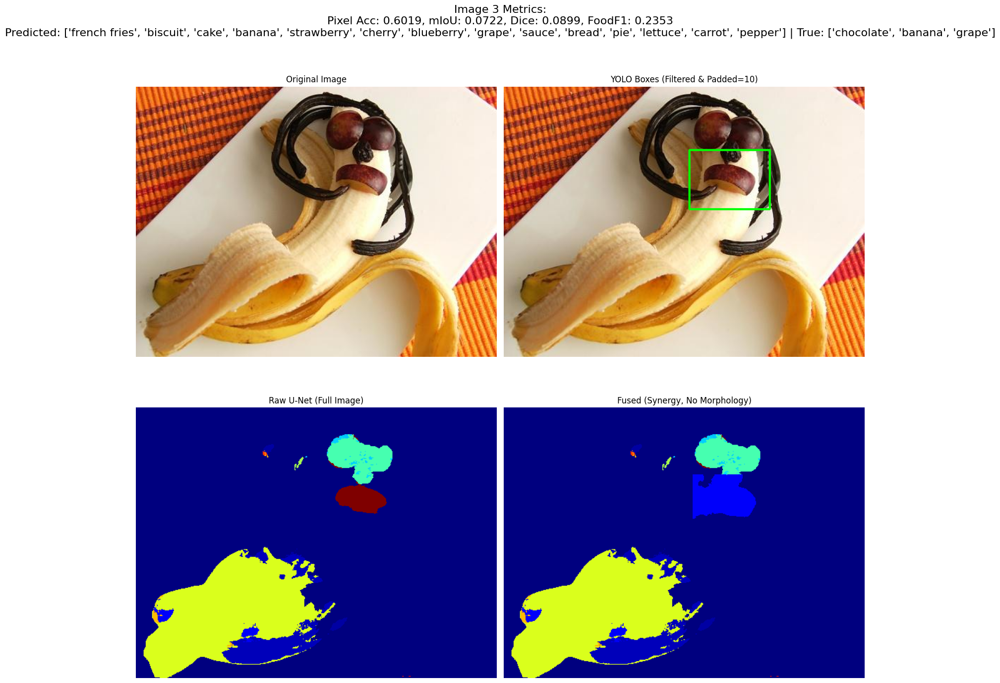


0: 640x640 1 cake, 1 steak, 1 sauce, 1 bread, 851.7ms
Speed: 3.9ms preprocess, 851.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 cake, 1 steak, 1 sauce, 1 bread, 854.6ms
Speed: 4.4ms preprocess, 854.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


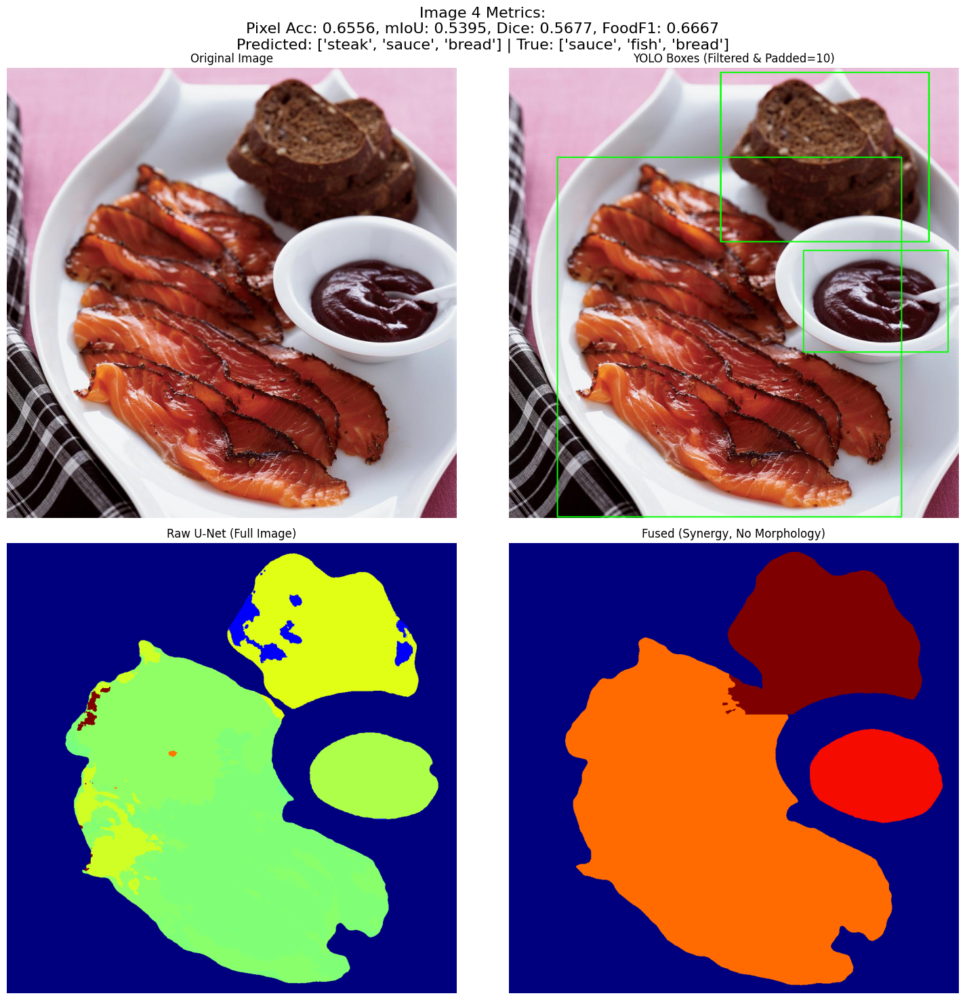


0: 480x640 1 chicken duck, 1 rice, 715.5ms
Speed: 27.4ms preprocess, 715.5ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chicken duck, 1 rice, 760.2ms
Speed: 4.9ms preprocess, 760.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


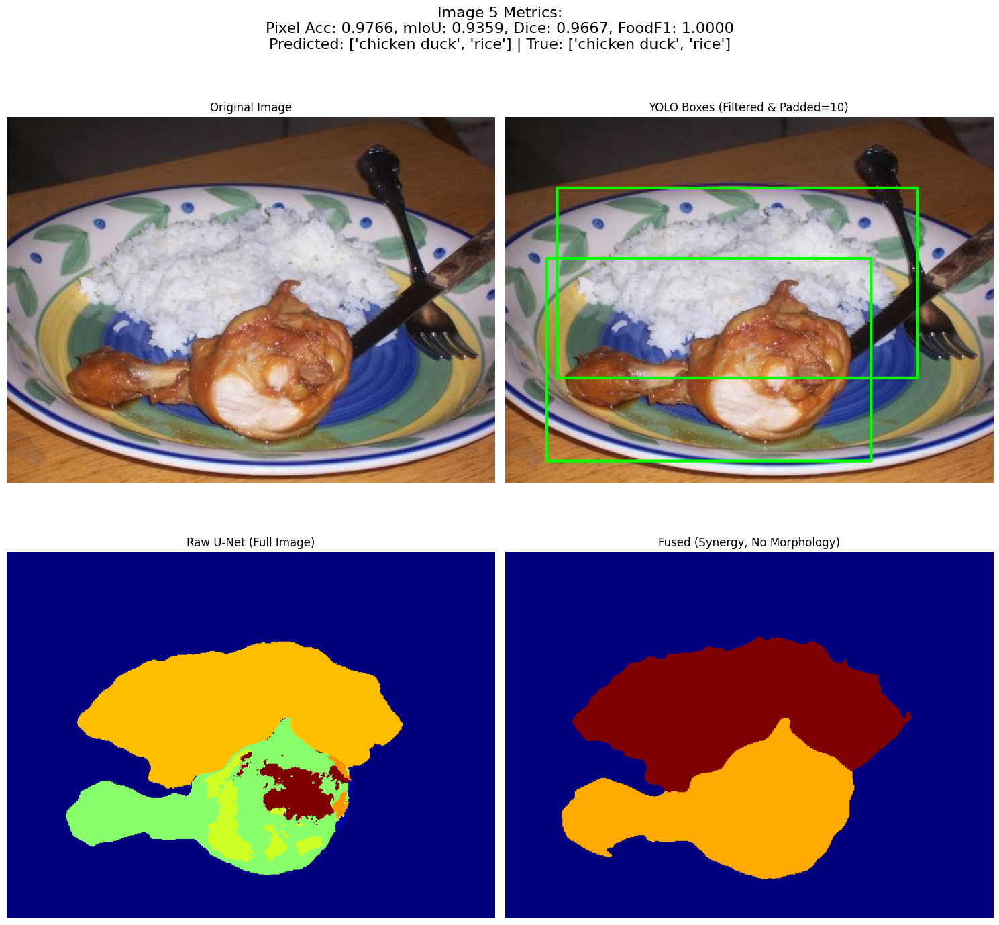


0: 448x640 1 biscuit, 1 mango, 1 grape, 1 melon, 1 pie, 1 cucumber, 625.2ms
Speed: 2.7ms preprocess, 625.2ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 biscuit, 1 mango, 1 grape, 1 melon, 1 pie, 1 cucumber, 642.7ms
Speed: 5.1ms preprocess, 642.7ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


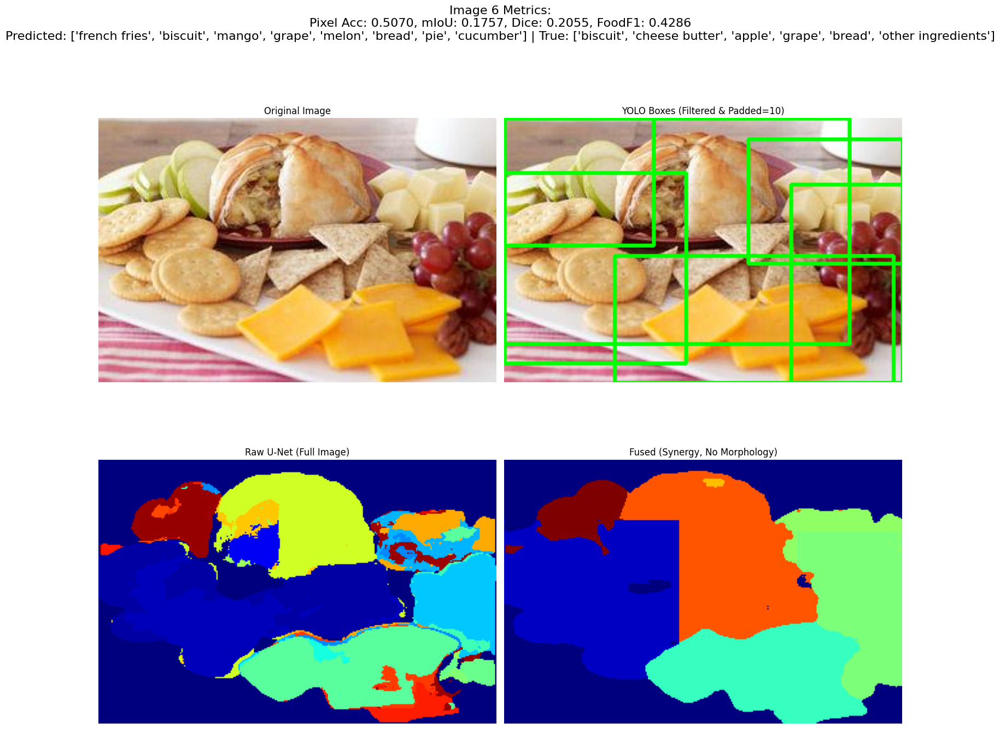


0: 640x480 1 wine, 1 strawberry, 1 blueberry, 1 kiwi, 1 fish, 663.0ms
Speed: 3.1ms preprocess, 663.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

0: 640x480 1 wine, 1 strawberry, 1 blueberry, 1 kiwi, 1 fish, 649.1ms
Speed: 3.2ms preprocess, 649.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


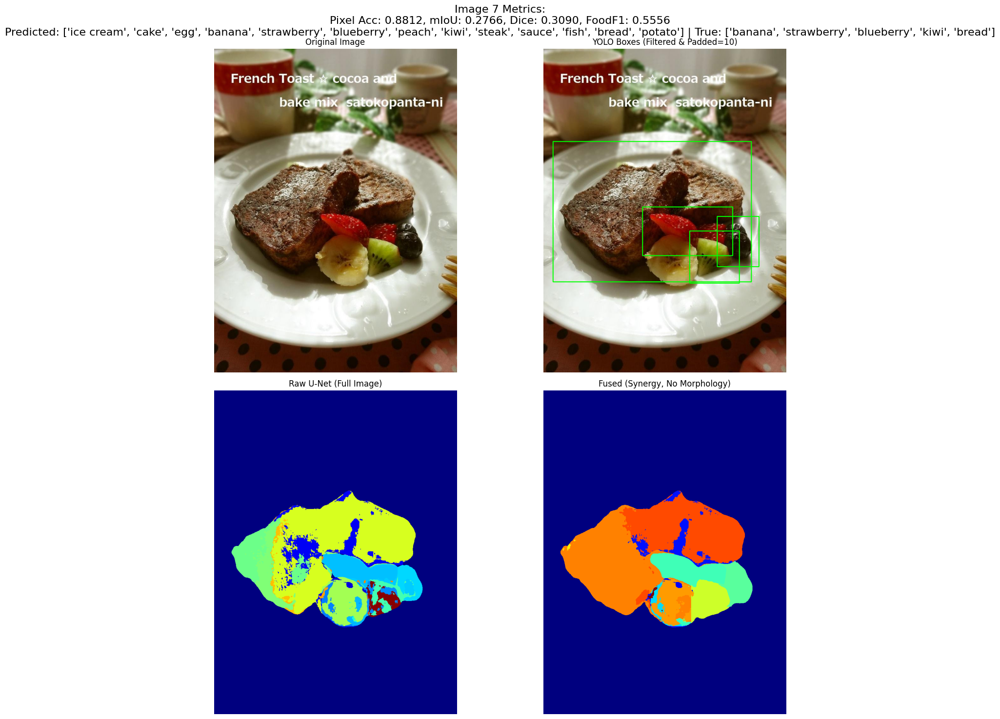


0: 480x640 1 chicken duck, 3 carrots, 728.5ms
Speed: 41.7ms preprocess, 728.5ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 chicken duck, 3 carrots, 761.8ms
Speed: 3.8ms preprocess, 761.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


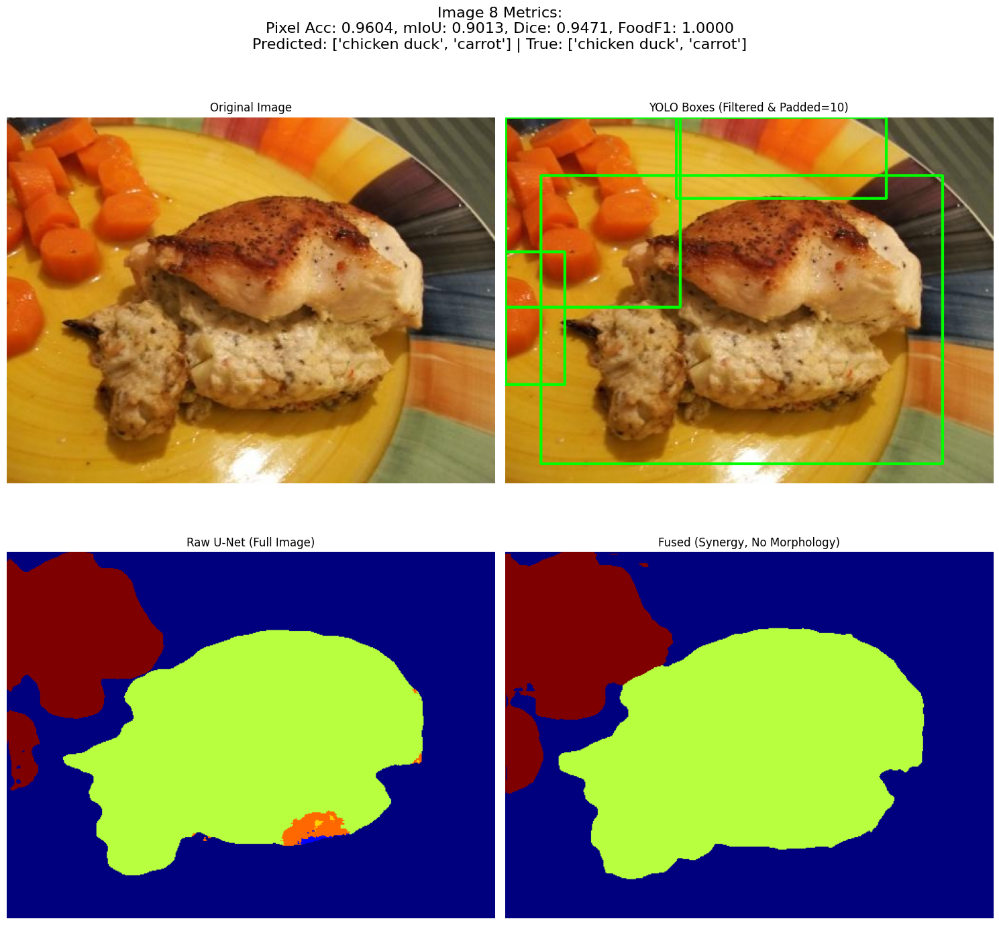


0: 480x640 2 mangos, 1 steak, 1 sauce, 1 spring onion, 1 lettuce, 3 cilantro mints, 2 onions, 1 pepper, 1 other ingredients, 692.4ms
Speed: 2.5ms preprocess, 692.4ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 mangos, 1 steak, 1 sauce, 1 spring onion, 1 lettuce, 3 cilantro mints, 2 onions, 1 pepper, 1 other ingredients, 660.0ms
Speed: 2.7ms preprocess, 660.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


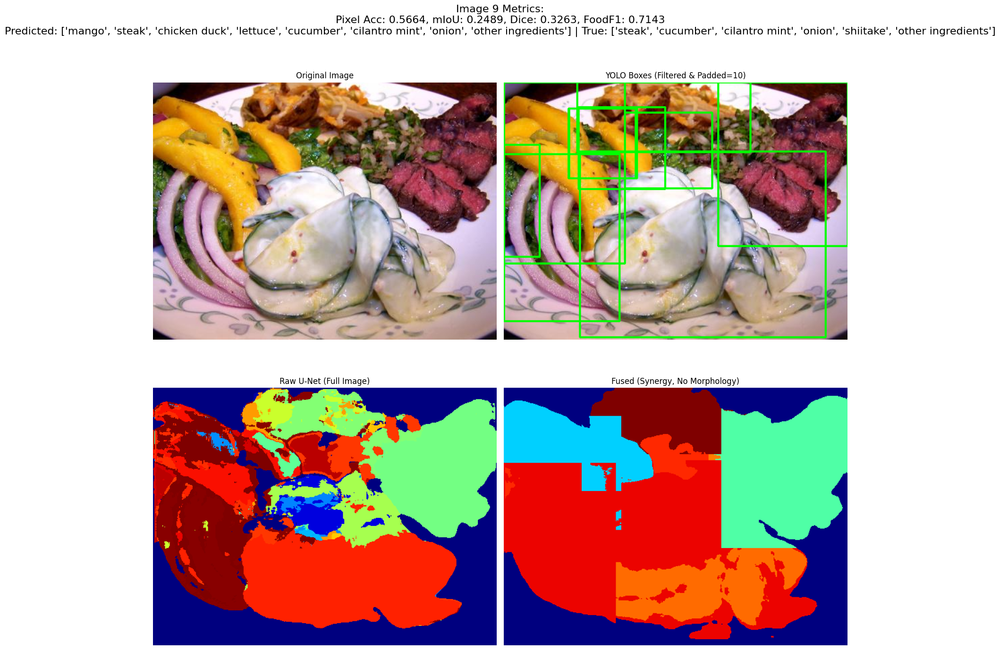


0: 480x640 1 biscuit, 1 chicken duck, 1 sauce, 1 rice, 1 pie, 1 potato, 671.3ms
Speed: 2.4ms preprocess, 671.3ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 biscuit, 1 chicken duck, 1 sauce, 1 rice, 1 pie, 1 potato, 671.6ms
Speed: 2.7ms preprocess, 671.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


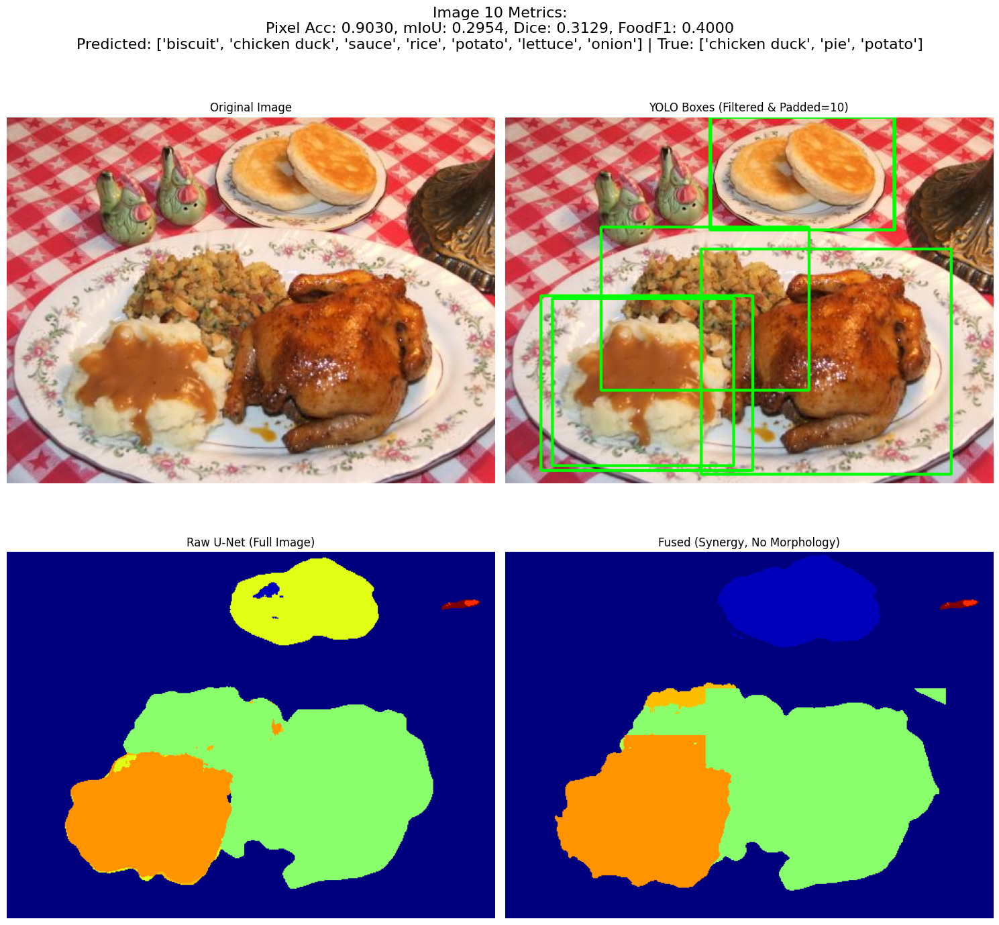


0: 480x640 1 wine, 2 sausages, 2 pies, 2 cilantro mints, 650.9ms
Speed: 9.4ms preprocess, 650.9ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 wine, 2 sausages, 2 pies, 2 cilantro mints, 671.2ms
Speed: 2.8ms preprocess, 671.2ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


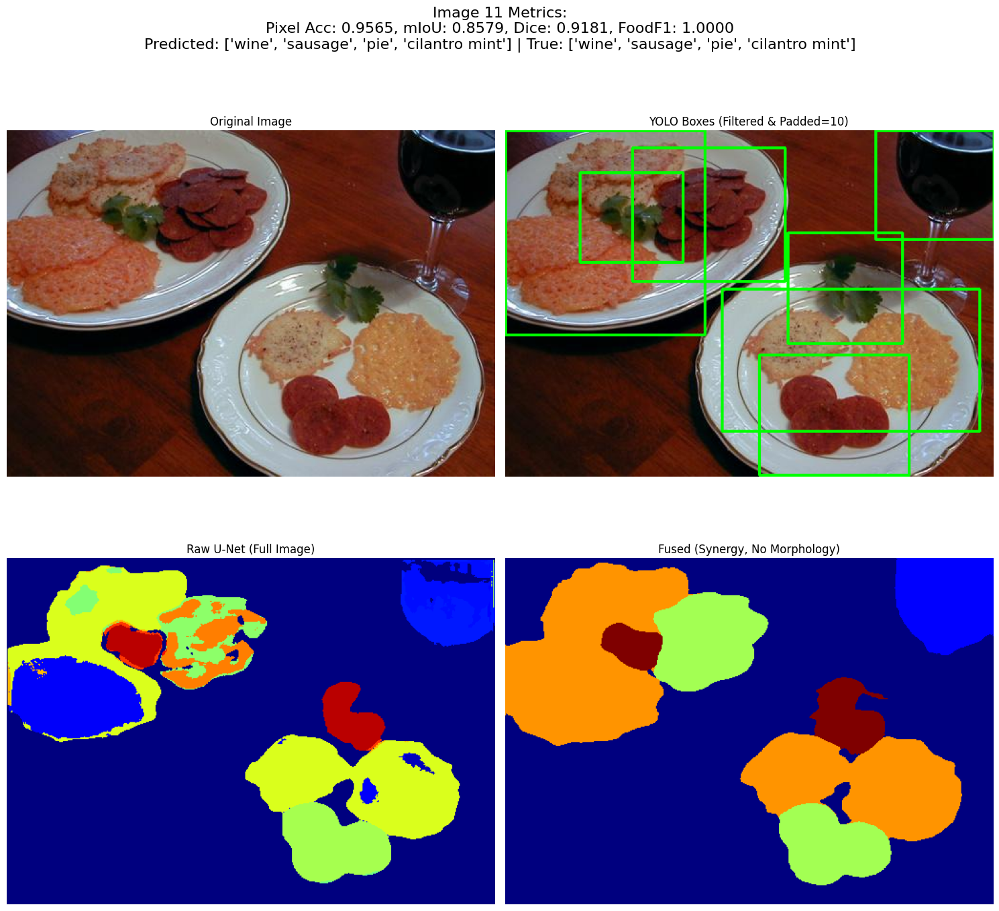


0: 640x640 1 chicken duck, 2 corns, 1 broccoli, 6 green beanss, 943.2ms
Speed: 41.8ms preprocess, 943.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 chicken duck, 2 corns, 1 broccoli, 6 green beanss, 889.4ms
Speed: 3.0ms preprocess, 889.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


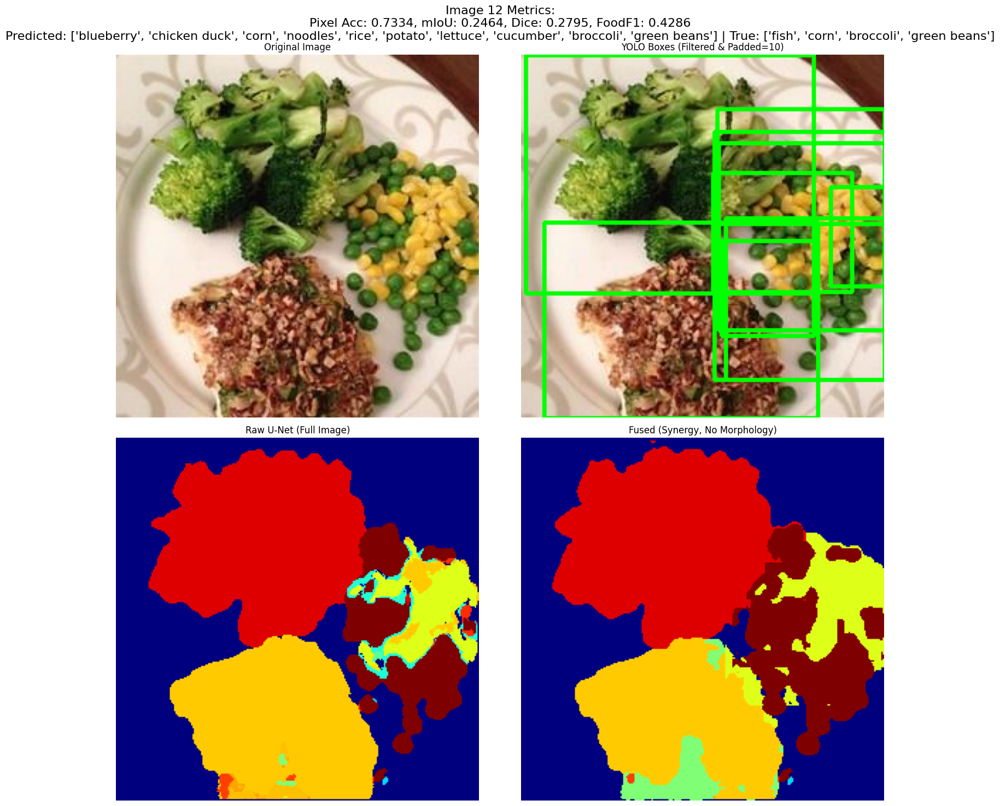


0: 640x448 1 candy, 1 cauliflower, 669.4ms
Speed: 9.8ms preprocess, 669.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 448)

0: 640x448 1 candy, 1 cauliflower, 654.9ms
Speed: 3.2ms preprocess, 654.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 448)


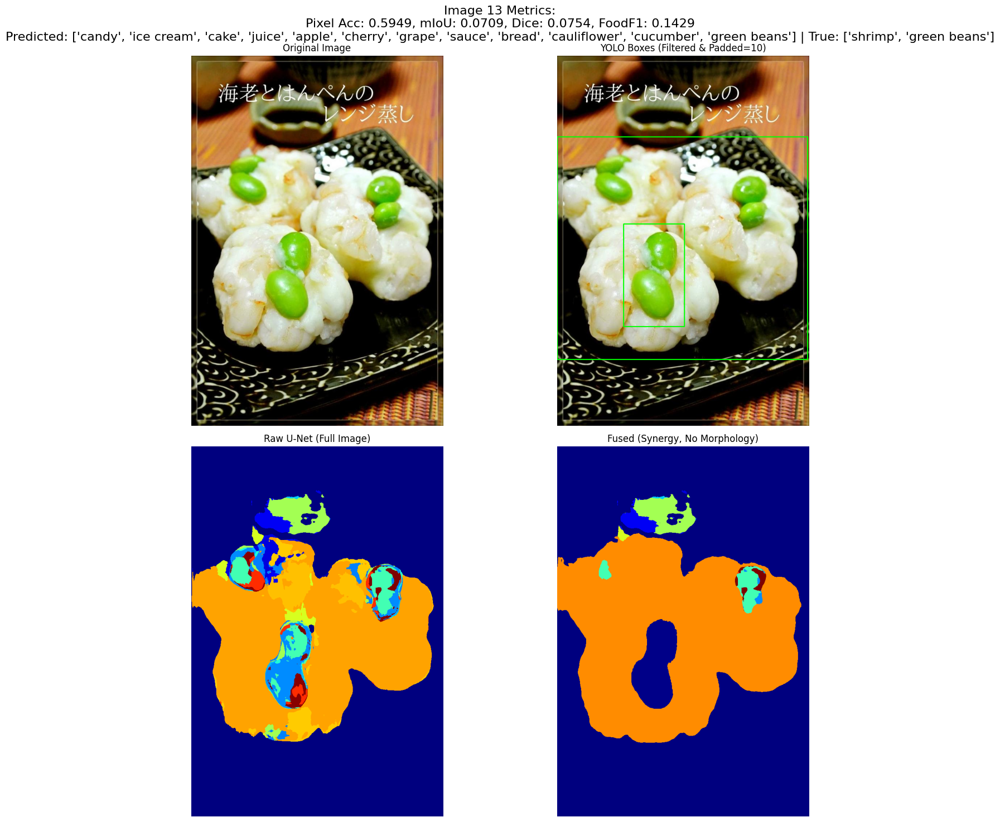


0: 480x640 1 french fries, 3 steaks, 1 chicken duck, 1 sauce, 3 breads, 2 onions, 654.7ms
Speed: 2.5ms preprocess, 654.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 french fries, 3 steaks, 1 chicken duck, 1 sauce, 3 breads, 2 onions, 686.9ms
Speed: 2.8ms preprocess, 686.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


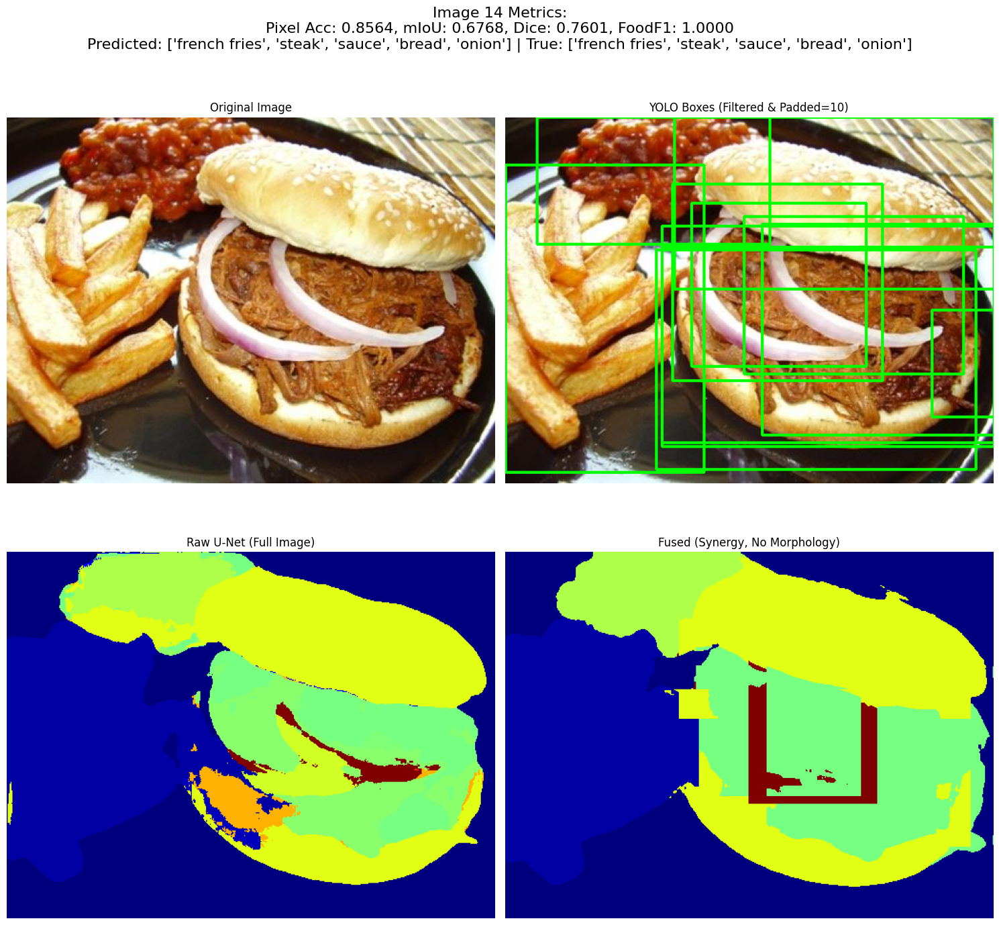


0: 640x640 1 biscuit, 1 cake, 1 strawberry, 1 potato, 935.7ms
Speed: 36.0ms preprocess, 935.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 biscuit, 1 cake, 1 strawberry, 1 potato, 883.3ms
Speed: 3.4ms preprocess, 883.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


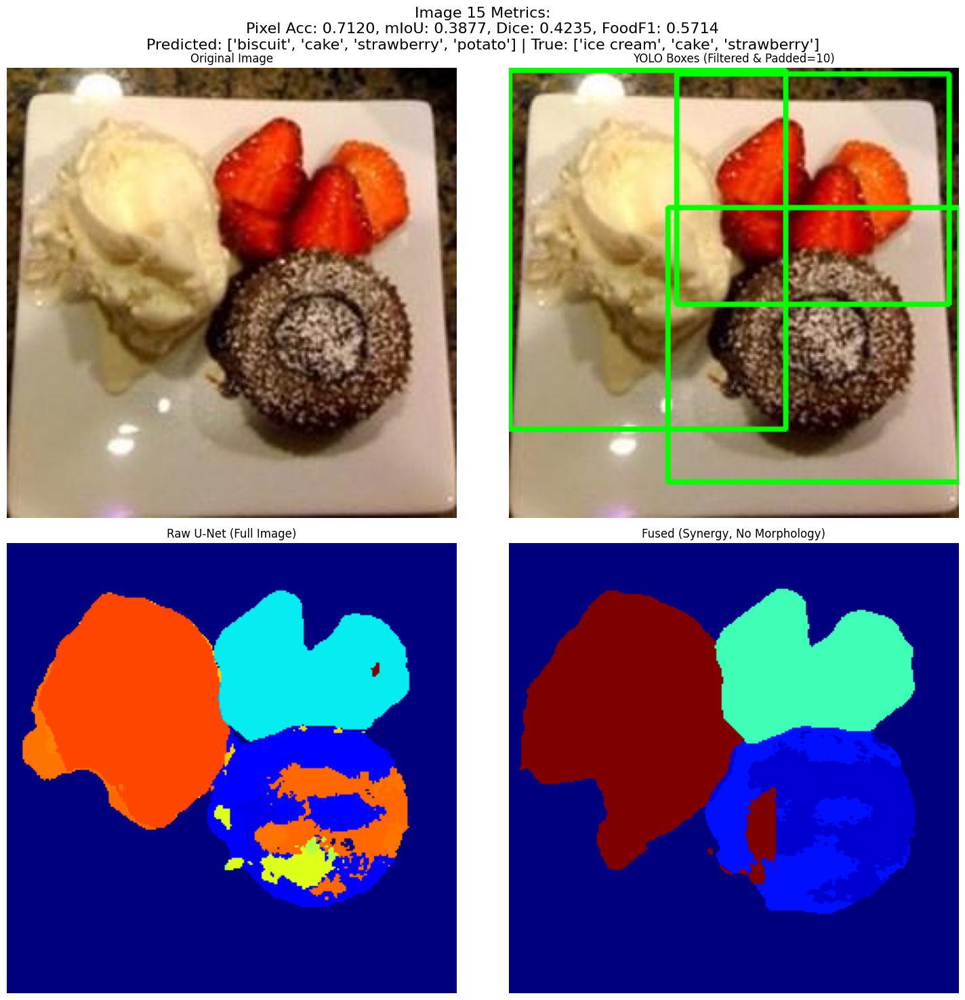


0: 640x640 1 cake, 2 strawberrys, 1 corn, 1 cilantro mint, 864.6ms
Speed: 3.8ms preprocess, 864.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 cake, 2 strawberrys, 1 corn, 1 cilantro mint, 883.3ms
Speed: 3.0ms preprocess, 883.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


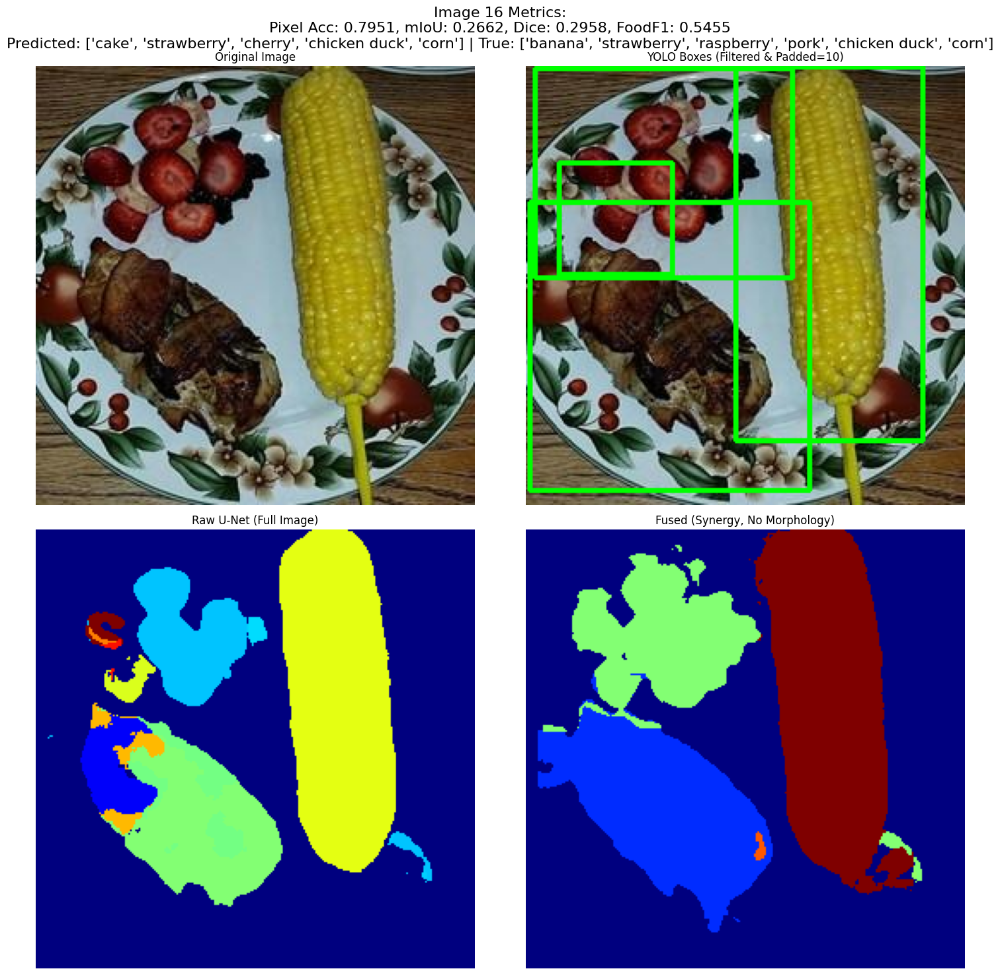

KeyboardInterrupt: 

In [3]:
import os, io, cv2, numpy as np, pandas as pd, torch
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
import yaml
from ultralytics import YOLO  # ensure: !pip install ultralytics --upgrade
import segmentation_models_pytorch as smp

############################################
# 1. YOLO -> U-Net Mappings
############################################
csv_path = "/content/drive/MyDrive/foodseg103/class_mappings.csv"
df_mapping = pd.read_csv(csv_path)

yolo_to_unet = {}
id_to_food = {0: "background"}
for _, row in df_mapping.iterrows():
    if int(row["Class Id"]) > 0:
        yolo_id = int(row["Class Id"]) - 1  # YOLO classes: 0-based
        unet_id = int(row["Class Id"])      # U-Net classes: 0=background, 1..103=food
        yolo_to_unet[yolo_id] = unet_id
        id_to_food[unet_id] = row["Class Name"]

print("YOLO to U-Net mapping:", yolo_to_unet)
print("ID to Food mapping:", id_to_food)

############################################
# 2. Load Validation Parquet
############################################
val_parquet_path = "/content/drive/MyDrive/foodseg103/validation-00000-of-00001-a5bfdaa5beb7006a.parquet"
val_df = pd.read_parquet(val_parquet_path)
print(f"Loaded {len(val_df)} validation samples.")

def extract_image_and_gt(row):
    """Extract a PIL image and its ground truth segmentation mask from a parquet row."""
    img_bytes = row['image'].get("bytes")
    if img_bytes is None:
        raise ValueError("No image bytes found.")
    img = Image.open(io.BytesIO(img_bytes)).convert("RGB")

    mask_bytes = row['label'].get("bytes")
    if mask_bytes is None:
        raise ValueError("No mask bytes found.")
    gt_mask = Image.open(io.BytesIO(mask_bytes))
    return img, gt_mask

############################################
# 3. Load YOLO
############################################
yolo_model_path = "/content/drive/MyDrive/food_yolo/results/yolov8l_detect_balanced/weights/best.pt"
yolo_model = YOLO(yolo_model_path)
print("YOLO model loaded.")

def run_yolo_once(img):
    """Run YOLO on the given image and return the bounding boxes."""
    results = yolo_model(img)
    if len(results) == 0 or results[0].boxes is None:
        return []
    return results[0].boxes

############################################
# 4. Load U-Net
############################################
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
unet_model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights="imagenet",
    in_channels=3,
    classes=104,
)
unet_model.to(DEVICE)
checkpoint = torch.load("/content/drive/MyDrive/foodseg103/unet_checkpoint_model2.pth", map_location=DEVICE)
unet_model.load_state_dict(checkpoint["model_state_dict"])
unet_model.eval()
print("U-Net model loaded on", DEVICE)

############################################
# 5. Metrics
############################################
def compute_pixel_accuracy(pred, gt):
    return np.sum(pred == gt) / pred.size

def compute_iou(pred, gt, num_classes=104):
    ious = []
    for cls in range(num_classes):
        pred_cls = (pred == cls).astype(np.uint8)
        gt_cls = (gt == cls).astype(np.uint8)
        intersection = np.sum(pred_cls & gt_cls)
        union = np.sum(pred_cls | gt_cls)
        if union == 0:
            continue
        ious.append(intersection / union)
    return np.mean(ious) if ious else 0.0

def compute_dice(pred, gt, num_classes=104):
    dices = []
    for cls in range(num_classes):
        pred_cls = (pred == cls).astype(np.uint8)
        gt_cls = (gt == cls).astype(np.uint8)
        intersection = np.sum(pred_cls * gt_cls)
        total = np.sum(pred_cls) + np.sum(gt_cls)
        if total == 0:
            continue
        dices.append((2 * intersection) / total)
    return np.mean(dices) if dices else 0.0

def list_food_items(seg_mask):
    unique = np.unique(seg_mask)
    items = [id_to_food.get(cls, f"Class {cls}") for cls in unique if cls != 0]
    return items

def compute_food_f1(pred_items, true_items):
    pred_set = set(pred_items)
    true_set = set(true_items)
    if len(pred_set) == 0 and len(true_set) == 0:
        return 1.0
    intersection = len(pred_set.intersection(true_set))
    if len(pred_set) == 0:
        precision = 1.0 if intersection == 0 else 0.0
    else:
        precision = intersection / len(pred_set)
    if len(true_set) == 0:
        recall = 1.0 if intersection == 0 else 0.0
    else:
        recall = intersection / len(true_set)
    if precision + recall == 0:
        return 0.0
    return 2.0 * (precision * recall) / (precision + recall)

############################################
# 6. U-Net Logits for the Full Image
############################################
def unet_logits_full_image(img, target_size=(512,512)):
    """
    Returns raw U-Net logits for the entire image (resized to target_size).
    We'll keep these logits for synergy with YOLO bounding boxes.
    """
    orig_w, orig_h = img.size
    # Resize image for U-Net
    img_resized = img.resize(target_size, Image.BILINEAR)
    img_arr = np.array(img_resized)

    # Convert to tensor
    img_tensor = torch.from_numpy(img_arr).permute(2,0,1).float().to(DEVICE)/255.0
    mean = torch.tensor([0.485, 0.456, 0.406], device=DEVICE).view(3,1,1)
    std  = torch.tensor([0.229, 0.224, 0.225], device=DEVICE).view(3,1,1)
    img_tensor = (img_tensor - mean) / (std + 1e-8)
    img_tensor = img_tensor.unsqueeze(0)  # [1,3,H,W]

    with torch.no_grad():
        logits = unet_model(img_tensor)  # shape [1, 104, H, W]
    return logits

############################################
# 7. Synergy Pipeline: Single Full-Image Logits + YOLO
############################################
def process_image_pipeline_synergy(img,
                                   raw_unet_logits,   # from unet_logits_full_image
                                   ALPHA=5.0,         # bigger alpha to override background
                                   pad=10,            # bounding box expansion
                                   conf_thresh=0.3):  # filter out boxes below this confidence
    """
    1) Upsample raw_unet_logits to original image size.
    2) For each YOLO bounding box with conf >= conf_thresh, add (ALPHA * conf)
       to the logit channel of YOLO's predicted class within [x1:x2, y1:y2].
    3) Argmax across all classes => final fused segmentation.
    4) NO morphological post-processing.
    """
    orig_w, orig_h = img.size
    final_seg = np.zeros((orig_h, orig_w), dtype=np.uint8)

    # 1) Upsample raw U-Net logits to original size
    upsampled_logits = torch.nn.functional.interpolate(
        raw_unet_logits,
        size=(orig_h, orig_w),
        mode='bilinear',
        align_corners=False
    )  # shape [1, 104, orig_h, orig_w]

    # Convert to numpy for easy slicing
    upsampled_logits_np = upsampled_logits.squeeze(0).cpu().numpy()  # shape [104, orig_h, orig_w]

    # 2) YOLO bounding boxes
    boxes = run_yolo_once(img)
    if len(boxes) == 0:
        # If no detections, just do a raw argmax on the upsampled logits
        fused_pred = np.argmax(upsampled_logits_np, axis=0).astype(np.uint8)
        return fused_pred

    for box in boxes:
        coords = box.xyxy[0].cpu().numpy()
        conf = float(box.conf.cpu().numpy()[0])
        if conf < conf_thresh:
            # Skip low-confidence boxes
            continue

        x1, y1, x2, y2 = map(int, coords)

        # Expand bounding box
        x1 = max(0, x1 - pad)
        y1 = max(0, y1 - pad)
        x2 = min(orig_w, x2 + pad)
        y2 = min(orig_h, y2 + pad)

        yolo_cls = int(box.cls.cpu().numpy()[0])
        unet_target_class = yolo_to_unet.get(yolo_cls, None)
        if unet_target_class is None:
            continue

        # 2b) Add offset to that channel in bounding box region
        upsampled_logits_np[unet_target_class, y1:y2, x1:x2] += (ALPHA * conf)

    # 3) Argmax across all classes => fused segmentation
    fused_pred = np.argmax(upsampled_logits_np, axis=0).astype(np.uint8)
    return fused_pred

############################################
# 8. Raw U-Net Segmentation (No YOLO) for Reference
############################################
def raw_unet_segmentation(img, target_size=(512,512)):
    """
    This runs U-Net on the entire image, returning the argmax segmentation.
    """
    # We can reuse unet_logits_full_image + upsample approach:
    logits = unet_logits_full_image(img, target_size=target_size)
    orig_w, orig_h = img.size
    upsampled_logits = torch.nn.functional.interpolate(
        logits,
        size=(orig_h, orig_w),
        mode='bilinear',
        align_corners=False
    )
    pred = torch.argmax(upsampled_logits, dim=1).squeeze(0).cpu().numpy()
    return pred

############################################
# 9. Evaluation Loop
############################################
all_pix_acc = []
all_miou = []
all_dice = []
all_food_f1 = []

MAX_DISPLAY = 25

for idx in range(len(val_df)):
    try:
        row = val_df.iloc[idx]
        img, gt_mask_img = extract_image_and_gt(row)
        gt_mask = np.array(gt_mask_img.convert("L"))

        # (A) Compute raw U-Net logits once
        full_img_logits = unet_logits_full_image(img, target_size=(512,512))

        # (B) Raw U-Net segmentation for reference
        raw_seg = raw_unet_segmentation(img, target_size=(512,512))

        # (C) YOLO bounding boxes for visualization (with padding)
        yolo_box_img = np.array(img).copy()
        boxes = run_yolo_once(img)
        for box in boxes:
            coords = box.xyxy[0].cpu().numpy()
            conf_ = float(box.conf.cpu().numpy()[0])
            if conf_ < 0.3:
                continue  # skip low-conf
            x1, y1, x2, y2 = map(int, coords)
            pad_ = 10
            x1 = max(0, x1 - pad_)
            y1 = max(0, y1 - pad_)
            x2 = min(img.width, x2 + pad_)
            y2 = min(img.height, y2 + pad_)
            cv2.rectangle(yolo_box_img, (x1,y1), (x2,y2), (0,255,0), 2)

        # (D) Synergy pipeline
        fused_seg = process_image_pipeline_synergy(
            img=img,
            raw_unet_logits=full_img_logits,
            ALPHA=3,      # Larger offset
            pad=5,         # Larger bounding box expansion
            conf_thresh=0.3 # Skip boxes below 0.3 confidence
        )

        # (E) Metrics
        pix_acc = compute_pixel_accuracy(fused_seg, gt_mask)
        miou = compute_iou(fused_seg, gt_mask, 104)
        dice = compute_dice(fused_seg, gt_mask, 104)
        all_pix_acc.append(pix_acc)
        all_miou.append(miou)
        all_dice.append(dice)

        pred_items = list_food_items(fused_seg)
        true_items = list_food_items(gt_mask)
        food_f1 = compute_food_f1(pred_items, true_items)
        all_food_f1.append(food_f1)

        # (F) Visualization
        if idx < MAX_DISPLAY:
            fig, axes = plt.subplots(2, 2, figsize=(15,15))
            axes[0,0].imshow(img)
            axes[0,0].set_title("Original Image")
            axes[0,0].axis("off")

            axes[0,1].imshow(yolo_box_img)
            axes[0,1].set_title("YOLO Boxes (Filtered & Padded=10)")
            axes[0,1].axis("off")

            axes[1,0].imshow(raw_seg, cmap="jet")
            axes[1,0].set_title("Raw U-Net (Full Image)")
            axes[1,0].axis("off")

            axes[1,1].imshow(fused_seg, cmap="jet")
            axes[1,1].set_title("Fused (Synergy, No Morphology)")
            axes[1,1].axis("off")

            title_str = (
                f"Image {idx} Metrics:\n"
                f"Pixel Acc: {pix_acc:.4f}, mIoU: {miou:.4f}, Dice: {dice:.4f}, FoodF1: {food_f1:.4f}\n"
                f"Predicted: {pred_items} | True: {true_items}"
            )
            plt.suptitle(title_str, fontsize=16)
            plt.tight_layout()
            plt.show()

    except Exception as e:
        print(f"Error processing image {idx}: {e}")

avg_pix_acc = np.mean(all_pix_acc)
avg_miou = np.mean(all_miou)
avg_dice = np.mean(all_dice)
avg_food_f1 = np.mean(all_food_f1)

print("\n======== Overall Validation Metrics ========")
print(f"Average Pixel Accuracy: {avg_pix_acc*100:.2f}%")
print(f"Average Mean IoU:       {avg_miou*100:.2f}%")
print(f"Average Mean Dice:      {avg_dice*100:.2f}%")
print(f"Average Food F1:        {avg_food_f1*100:.2f}%")
print("==============================================")
